<a href="https://colab.research.google.com/github/208B1A0428/RESUME-PROJECTS/blob/master/Human_Action_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import the Libraries**

In [4]:
# Discard the output of this cell.
%%capture

#Install the requried libraries
!pip install pafy youtube-dl moviepy
!pip install tensorflow
!pip install keras

In [38]:
# Import the required libraries
import cv2
import os
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import*
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import ConvLSTM2D, MaxPooling3D, TimeDistributed, Flatten, Dense, Dropout
from tensorflow.keras.layers import Conv2D, MaxPooling2D, LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [6]:
seed_constant=27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

**Download and Visualize the Data with its Labels**

In [ ]:
# Discard the output of this cell
#%%capture

#Download the UCF50 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

#Extract the Dataset
!unrar x UCF50.rar

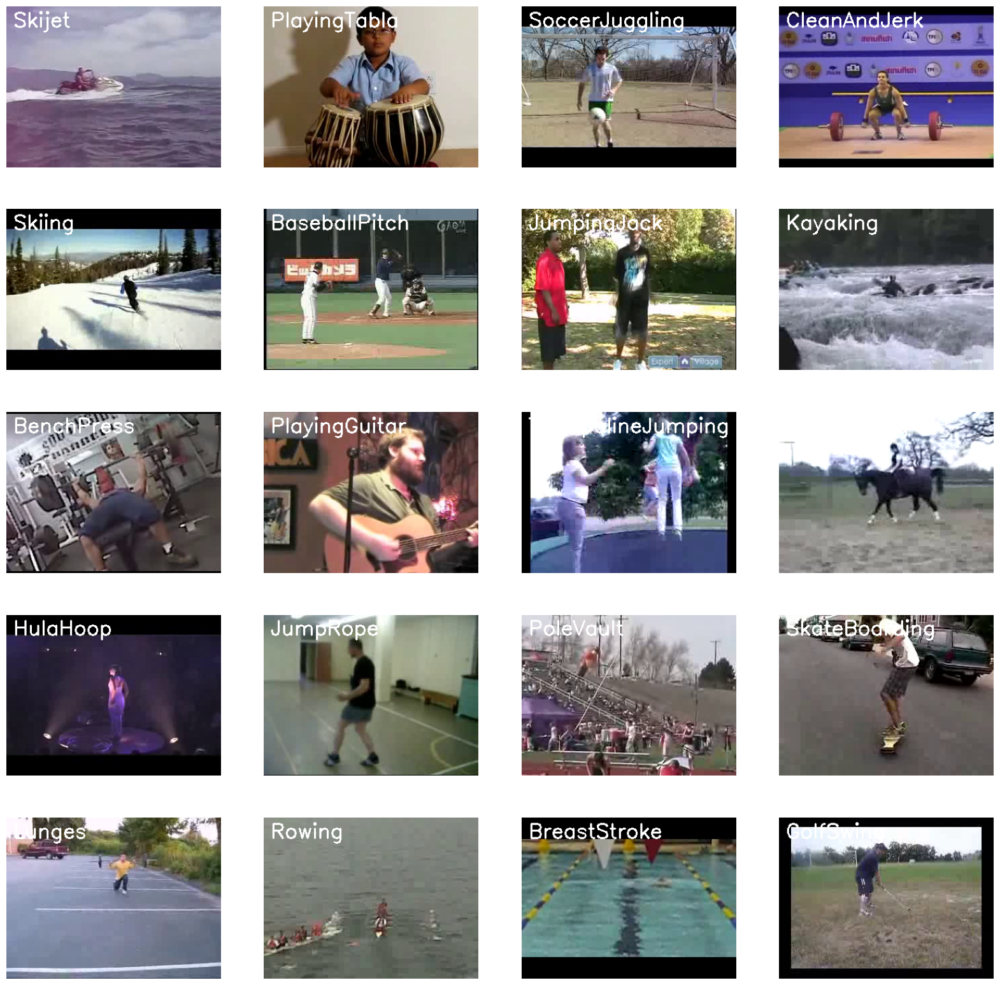

In [8]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize=(20,20))

# Get the names of all classes/categories in UCF50.
all_classes_names=os.listdir('UCF50')

# Generate a list of 20 random values. The values will be between 0-50.
# Where 50 is the total number of the class in the dataset.
random_range=random.sample(range(len(all_classes_names)),20)

# Iterating through all the generated random values.
for counter,random_index in enumerate(random_range,1):

  # Retrieve a Class Name using the Random Index
  selected_class_Name = all_classes_names[random_index]

  #Retrive the list of all the video files present in the randomly selected Class Directory.
  video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')

  # Randomly the select the video file from the list retrieved from the randomly seleced Class Directory.
  selected_video_file_name = random.choice(video_files_names_list)

  # Initializs a videoCapture objec to real from the video file
  video_reader=cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')

  # Read the first frame of the video file
  ret,bgr_frame = video_reader.read()

  #Release the VideoCapture object.
  video_reader.release()
  if(ret):
    #Convert the frame from BGR into RGB frame
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
    # Write the class name on the video frame
    cv2.putText(rgb_frame,selected_class_Name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

    # Display the frame.
    plt.subplot(5,4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')


**Preprocess the Dataset**

In [9]:
# Specify the height and width to which each video frame will be resized in our dataset
IMAGE_HEIGHT, IMAGE_WIDTH=64,64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH =20

#Specify the directory containing the UCF50 dataset
DATASET_DIR = 'UCF50'

#Specify the directory containing the UCF50 dataset
CLASSES_LIST=['PlayingGuitar','TaiChi','Swing','HorseRace']

**Create a Function to Extract, Resizs & Normalize Frames**

In [10]:
def frames_extraction(video_path):

  # Declare a list to store video frames.
  frames_list=[]

  # Read the video file
  video_reader = cv2.VideoCapture(video_path)

  # Get the total number of frames in video
  video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

  #Calculate the interval after which frames will be the added to the list
  skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

  # Iterate through the Video Frames
  for frame_counter in range(SEQUENCE_LENGTH):

    # Set the current frame position of the video
    video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

    # Reading the frame from the video
    success, frame = video_reader.read()

    # Chek if Video frame is not successfully read then break the loop
    if not success:
      break

    # Resize the Frame to fixed height and width
    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT,IMAGE_WIDTH))

    # Normalize the resizing the frame by the dividing it with 255 so that each pixel value then lies between 0 and 1
    normalized_frame = resized_frame/255

    # Append the normalized frame into the frames list
    frames_list.append(normalized_frame)

  # Release the VideoCapture Object
  video_reader.release()

  # Return the frames list
  return frames_list

**Create a Function for Dataset Creation**

In [11]:
def create_dataset():

  # Declared Empty Lists to store the features, labels and video file path values.
  features = []
  labels = []
  video_files_paths = []

  # Iteratin through all the classes mentioned in the classes list
  for class_index,class_name in enumerate(CLASSES_LIST):

    # Display the name of the class whose data is being extracted.
    print(f'Extracting Data of Class: {class_name}')

    # Get the list of the video files present in the specific class name directory.
    files_list = os.listdir(os.path.join(DATASET_DIR,class_name))

  # Iterate through all the files present in the files list
    for file_name in files_list:

      # Get the Complete video path
      video_file_path = os.path.join(DATASET_DIR,class_name,file_name)

      # Extract the frames of the video file.
      frames = frames_extraction(video_file_path)

      # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above
      # So ignore the vidoes having frames less than the SWQUENCE_LENGTH
      if len(frames) == SEQUENCE_LENGTH:

        # Append the data to their respective lists
        features.append(frames)
        labels.append(class_index)

        video_files_paths.append(video_file_path)

  # Converting the list to numpy arrays
  features = np.asarray(features)
  labels = np.array(labels)


  # Return the frames,class_index, video file path
  return features, labels ,video_files_paths

In [12]:
# Create the dataset
features, labels ,video_files_paths = create_dataset()

Extracting Data of Class: PlayingGuitar
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


Now we will convert labels (class indexes) into one hot encoded vectors

In [ ]:
# Using Keras's to_catergorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)
one_hot_encoded_labels

**Split the Data into Train and Test Set**

In [16]:
# Split the Data into Train (75%) and Test Set (25%)
features_train, features_test,labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size=0.25, shuffle = True,
                                                                           random_state = seed_constant)

**Implement the ConvLSTM Approach**

In [17]:
def create_convlstm_model():

  # We will use a Sequential model for model construction
  model = Sequential()

  # Define the Model Architecture.
  model.add(ConvLSTM2D(filters=4, kernel_size=(3, 3), activation='tanh', data_format="channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH,3)))

  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))

  model.add(ConvLSTM2D(filters = 8,kernel_size = (3,3),activation= 'tanh',data_format = "channels_last",
                       recurrent_dropout=0.2, return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))


  model.add(ConvLSTM2D(filters = 14,kernel_size = (3,3),activation= 'tanh',data_format = "channels_last",
                       recurrent_dropout=0.2, return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  model.add(TimeDistributed(Dropout(0.2)))


  model.add(ConvLSTM2D(filters = 16,kernel_size = (3,3),activation= 'tanh',data_format = "channels_last",
                       recurrent_dropout=0.2, return_sequences=True))

  model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
  #model.add(TimeDistributed(Dropout(0.2)))


  model.add(Flatten())

  model.add(Dense(len(CLASSES_LIST),activation = 'softmax'))

  model.summary()

  return model


Now we will utilize the function **create_convlstm_model()** created above,to construct the required convlstm model

In [18]:
# Construct the required convlstm model.
convlstm_model = create_convlstm_model()

# Display the success message
print('Model Created Successfully')


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 20, 62, 62, 4)     1024      
                                                                 
 max_pooling3d (MaxPooling3  (None, 20, 31, 31, 4)     0         
 D)                                                              
                                                                 
 time_distributed (TimeDist  (None, 20, 31, 31, 4)     0         
 ributed)                                                        
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, 20, 29, 29, 8)     3488      
                                                                 
 max_pooling3d_1 (MaxPoolin  (None, 20, 15, 15, 8)     0         
 g3D)                                                            
                                                        

**Check Model's Structure**

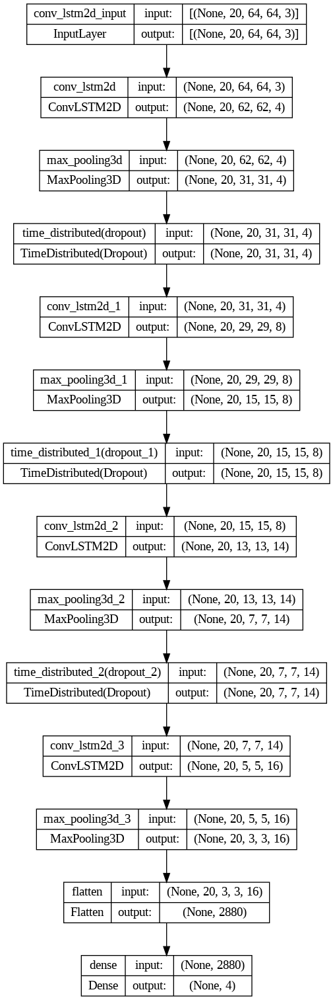

In [19]:
# Plot the structure of the contructed model.
plot_model(convlstm_model,to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

**Compile & Train the Model**

In [ ]:
print(labels_train)

In [21]:
# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function ,optimizer and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

# Start training the model
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4,
                                                     shuffle = True, validation_split = 0.2,
                                                     callbacks = [early_stopping_callback])

Epoch 1/50
79/79 [==============================] - 165s 2s/step - loss: 1.2563 - accuracy: 0.4522 - val_loss: 1.1585 - val_accuracy: 0.5443
Epoch 2/50
79/79 [==============================] - 148s 2s/step - loss: 0.8694 - accuracy: 0.6656 - val_loss: 1.0060 - val_accuracy: 0.5696
Epoch 3/50
79/79 [==============================] - 146s 2s/step - loss: 0.7124 - accuracy: 0.7325 - val_loss: 0.4219 - val_accuracy: 0.8228
Epoch 4/50
79/79 [==============================] - 144s 2s/step - loss: 0.4382 - accuracy: 0.8439 - val_loss: 0.8196 - val_accuracy: 0.6962
Epoch 5/50
79/79 [==============================] - 143s 2s/step - loss: 0.3684 - accuracy: 0.8758 - val_loss: 0.4635 - val_accuracy: 0.8481
Epoch 6/50
79/79 [==============================] - 144s 2s/step - loss: 0.2753 - accuracy: 0.9045 - val_loss: 0.8418 - val_accuracy: 0.7089
Epoch 7/50
79/79 [==============================] - 145s 2s/step - loss: 0.2033 - accuracy: 0.9268 - val_loss: 0.2020 - val_accuracy: 0.9114
Epoch 8/50
79

**Evaluate the Trained Model**

After training,we will evaluate the model on the test set

In [22]:
# Evaluate the trained model
model_evaluation_history = convlstm_model.evaluate(features_test,labels_test)

5/5 [==============================] - 15s 3s/step - loss: 0.1252 - accuracy: 0.9466


**Save the Model**

Now we will save the model to avoid training it from scratch every time we need the model

In [23]:
# Get the loss and accuracy from model_evalution_history
model_evaluation_loss,model_evaluation_accuracy = model_evaluation_history

date_time_format = '%Y_%n_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt,date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple save models
model_file_name = f'convlstm_model__Date_Time_{current_date_time_string}__Loss_{model_evaluation_loss}__Accuracy_{model_evaluation_accuracy}'

#Save the model
convlstm_model.save(model_file_name)

**Plot Model's Loss & Accuracy Curves**

In [30]:
def plot_metric(convlstm_model_training_history,metric_name_1,metric_name_2,plot_name):
  # Get metric values using metric names as identifiers
  metric_value_1 = convlstm_model_training_history.history[metric_name_1]
  metric_value_2 = convlstm_model_training_history.history[metric_name_2]

  # Construct a range object which will be used as x-axis (horizontal plane) of the graph
  epochs = range(len(metric_value_1))

  # Plot the Graph
  plt.plot(epochs, metric_value_1, 'blue',label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'orange',label = metric_name_2)

  # Add title to the plot
  plt.plot(str(plot_name))

  # Add the legend to the plot
  plt.legend()

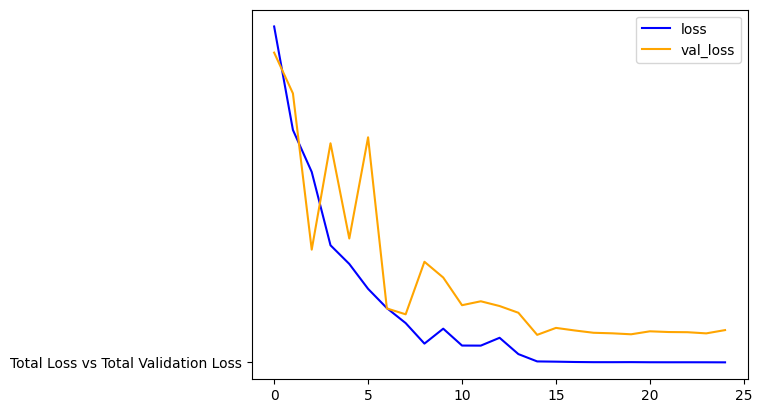

In [31]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history,'loss','val_loss','Total Loss vs Total Validation Loss')

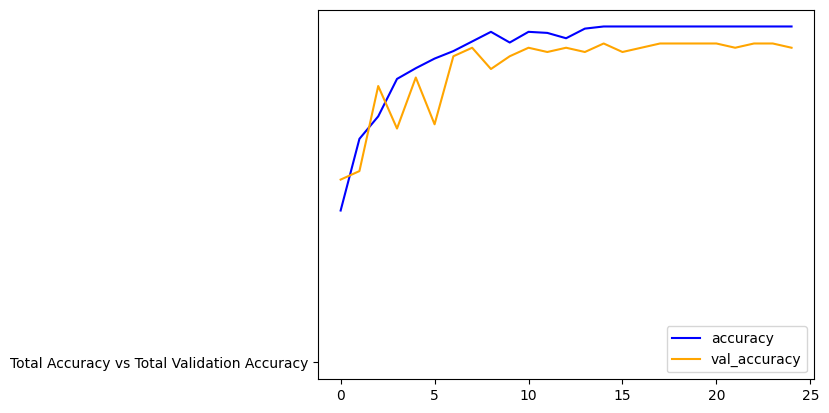

In [32]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history,'accuracy','val_accuracy','Total Accuracy vs Total Validation Accuracy')

**Implement the LCRN**

In [36]:
def create_LRCN_model():
  # we will use a Sequential model for model contruction
  model = Sequential()

  # Define the Model Architecture
  model.add(TimeDistributed(Conv2D(16,(3,3),padding='same', activation = 'relu'),
                            input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

  model.add(TimeDistributed(MaxPooling2D(4,4)))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(32,(3,3),padding='same', activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D(4,4)))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64,(3,3),padding='same', activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D(2,2)))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64,(3,3),padding='same', activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D(2,2)))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Flatten()))

  model.add(LSTM(32))

  model.add(Dense(len(CLASSES_LIST),activation = 'softmax'))

  # Display the Models summary
  model.summary()

  return model

Now we will utilize the function create_LRCN_model() created avobe to construct the required LRCN model

In [39]:
# Construct the required LRCN_model
LRCN_model = create_LRCN_model()

# Display the success message
print('Model created  Successfully')

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_16 (TimeD  (None, 20, 64, 64, 16)    448       
 istributed)                                                     
                                                                 
 time_distributed_17 (TimeD  (None, 20, 16, 16, 16)    0         
 istributed)                                                     
                                                                 
 time_distributed_18 (TimeD  (None, 20, 16, 16, 16)    0         
 istributed)                                                     
                                                                 
 time_distributed_19 (TimeD  (None, 20, 16, 16, 32)    4640      
 istributed)                                                     
                                                                 
 time_distributed_20 (TimeD  (None, 20, 4, 4, 32)     

**Check Model's Structure**

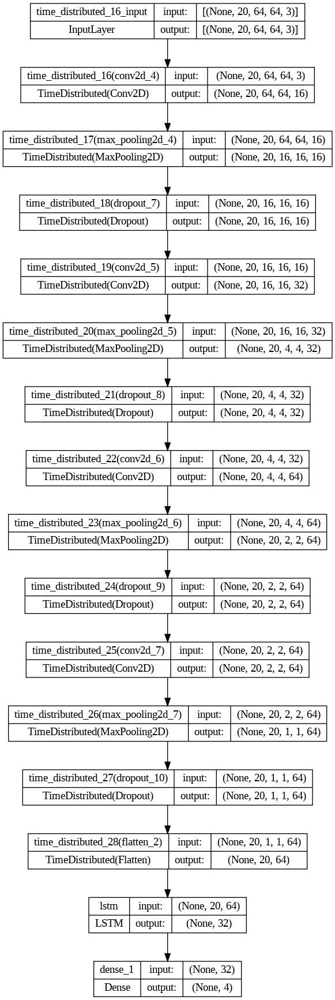

In [40]:
# Plot the structure of the constructed LRCN model
plot_model(LRCN_model, to_file = 'LRCN_model_structure_plot.png', show_shapes = True, show_layer_names = True)

**Compile & Train the Model**

In [41]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function , optimizer and metrics to the model
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics =['accuracy'])

# Start training the model
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 4,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/20
79/79 [==============================] - 21s 217ms/step - loss: 1.3519 - accuracy: 0.3344 - val_loss: 1.2534 - val_accuracy: 0.4051
Epoch 2/20
79/79 [==============================] - 15s 192ms/step - loss: 1.2209 - accuracy: 0.4268 - val_loss: 1.1162 - val_accuracy: 0.4557
Epoch 3/20
79/79 [==============================] - 16s 205ms/step - loss: 1.2210 - accuracy: 0.4490 - val_loss: 1.2033 - val_accuracy: 0.4177
Epoch 4/20
79/79 [==============================] - 16s 204ms/step - loss: 0.9672 - accuracy: 0.5478 - val_loss: 1.2806 - val_accuracy: 0.4430
Epoch 5/20
79/79 [==============================] - 16s 200ms/step - loss: 0.8325 - accuracy: 0.6815 - val_loss: 0.8356 - val_accuracy: 0.7468
Epoch 6/20
79/79 [==============================] - 17s 216ms/step - loss: 0.6162 - accuracy: 0.7771 - val_loss: 0.7209 - val_accuracy: 0.7595
Epoch 7/20
79/79 [==============================] - 15s 190ms/step - loss: 0.4464 - accuracy: 0.8408 - val_loss: 0.6260 - val_accuracy: 0.7722

**Evaluating the trained Model**

As done for the previous one,we will evaluate the LRCN model on the test set

In [43]:
# Evaluate the trained model
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

5/5 [==============================] - 3s 512ms/step - loss: 0.1882 - accuracy: 0.9542


**Save the Model**

In [44]:
# Get the loss and accuracy from model_evalution_history
model_evaluation_loss,model_evaluation_accuracy = model_evaluation_history

date_time_format = '%Y_%n_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt,date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple save models
model_file_name = f'convlstm_model__Date_Time_{current_date_time_string}__Loss_{model_evaluation_loss}__Accuracy_{model_evaluation_accuracy}'

#Save the model
LRCN_model.save(model_file_name)

**Plot Model's Loss & Accuracy Curves**

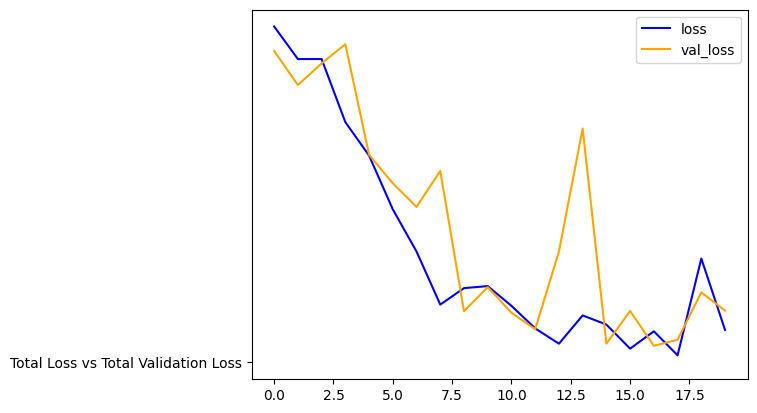

In [45]:
# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history,'loss','val_loss','Total Loss vs Total Validation Loss')

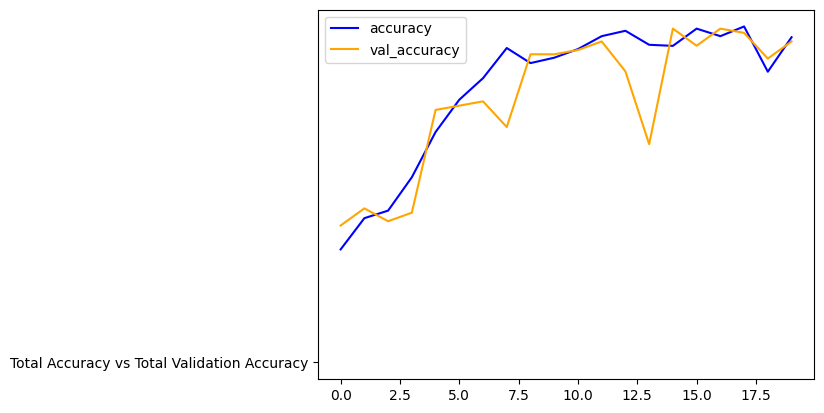

In [46]:
# Visualize the training and validation accuracy metrices.
plot_metric(LRCN_model_training_history,'accuracy','val_accuracy','Total Accuracy vs Total Validation Accuracy')

In [47]:
def download_youtube_videos(youtube_video_url, output_directory):
  # Create a video object which contains useful information about the video
  video = pafy.new(youtube_video_url)

  # Retrieve the title of the video
  title = video.title

  # Get the best available quality object for the video
  video_best = video.getbest()

  # Construct the output file path
  output_file_path = f'{output_directory}/{title}.mp4'

  # Download the youtube video at the best available quality and store it to the constructed path
  video_best.download(filepath = output_file_path,quit = True)

  return title


In [54]:
!youtube-dl --update
!pip install pytube

It looks like you installed youtube-dl with a package manager, pip, setup.py or a tarball. Please use that to update.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.6 MB/s eta 0:00:00


**Download a Test Video**

In [ ]:
# Make the output directory it it does not exist
test_videos_directory = 'test_videos'

#Download a Youtube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE',test_videos_directory)

# Get the Youtube video path's just download
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'


In [56]:
from pytube import YouTube

def download_youtube_video(video_url, output_directory):
    try:
        # Create a YouTube object
        yt = YouTube(video_url)

        # Get the highest resolution stream (video and audio)
        video_stream = yt.streams.get_highest_resolution()

        # Download the video to the specified directory
        video_stream.download(output_path=output_directory)

        return yt.title  # Return the title of the downloaded video
    except Exception as e:
        return f"Error: {str(e)}"

# Define the output directory
test_videos_directory = 'test_videos'

# YouTube video URL
video_url = 'https://www.youtube.com/watch?v=8u0qjmHIOcE'

# Download the YouTube video and get its title
video_title = download_youtube_video(video_url, test_videos_directory)

# Get the path of the downloaded video
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

print(f"Video downloaded with title: {video_title}")
print(f"Video file path: {input_video_file_path}")


Video downloaded with title: Test Video
Video file path: test_videos/Test Video.mp4


**Create a Function To Perform Action Recognition on Videos**

In [64]:
def predict_on_video(video_files_path, output_file_path, SEQUENCE_LENGTH):

  # Initialize the VideoCapture object to read from the video file
  video_reader =cv2.VideoCapture(video_files_path)

  # Get the width and height of the video
  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize the VideoWriter object to store the output video in the disk
  video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                              video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

  # Declare a queue to store video frames
  frames_queue = deque(maxlen = SEQUENCE_LENGTH)

  predicted_class_name = ''

  # Initialize a variable to store the predicted action being performed in the video
  while video_reader.isOpened():

    # Read the Frame
    ok, frame = video_reader.read()

    # check if the frame is not read properly then break loop
    if not ok:
      break

    # Resize the frame to fixed Dimensions
    resized_frame = cv2.resize (frame,(IMAGE_HEIGHT,IMAGE_WIDTH))

    # Normalizing
    normalized_frame =resized_frame/255

    # Appending the pre-processed freame into the frames list
    frames_queue.append(normalized_frame)

    if(len(frames_queue)== SEQUENCE_LENGTH):

      # Pass the normalized frames to the model and get the predict probabilities
      predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue,axis = 0))[0]

      # Get the class name on top of the frame
      predicted_label = np.argmax(predicted_labels_probabilities)

      # Get the index of class with highest probability
      predicted_class_name = CLASSES_LIST[predicted_label]

    # Write predicted class name top of the frame
    cv2.putText(frame,predicted_class_name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(0,255,0),2)

    # write the frame into the disk using the videowriter object
    video_writer.write(frame)

  # Release the videocapture and videowriter objects
  video_reader.release()
  video_writer.release()

**Perform Action Recognition on the Test Video**

In [65]:
# construct the output video path
output_video_file_path = f'{test_videos_directory}/{video_title}.Output.Seqlen{SEQUENCE_LENGTH}.MP4'

# perform Action Recognition on the Test video
predict_on_video(input_video_file_path,output_video_file_path,SEQUENCE_LENGTH)

#Display the output video
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 36ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▊| 855/867 [00:02<00:00, 323.24it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Test Video.Output.Seqlen20.MP4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


I selected the ConvLSTM-based action recognition model in the demo for several reasons:

1. **Temporal Modeling:** Action recognition often requires modeling both spatial and temporal information. ConvLSTM layers, which are a combination of convolutional and LSTM layers, are well-suited for this purpose. They can capture spatial patterns within individual frames while also learning temporal dependencies across multiple frames.

2. **Deep Learning:** Deep learning models have proven to be highly effective in various computer vision tasks, including action recognition. ConvLSTM is a deep learning architecture, and it can automatically learn relevant features from video sequences, making it a strong choice for this task.

3. **Sequential Nature of Actions:** Actions are inherently sequential in nature. An action involves a series of movements or changes over time, making ConvLSTM a natural fit for modeling such sequences.

4. **State-of-the-Art Performance:** ConvLSTM networks have shown state-of-the-art performance in action recognition tasks, especially when combined with appropriate pre-processing and data augmentation techniques.

5. **Ease of Implementation:** While ConvLSTM networks are complex under the hood, they are relatively easy to implement using deep learning frameworks like Keras or Tensorflow. This makes it accessible for researchers and developers to build action recognition systems.

Overall, the choice of a ConvLSTM-based model was motivated by its ability to capture both spatial and temporal information, its strong performance in action recognition, and its suitability for sequential data, which aligns with the nature of action recognition tasks.